### Authored By Amirul Uzair

# Load Dependencies

In [1]:
#load libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import pyplot
from pandas import read_csv
from pandas import set_option
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import Binarizer
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from pandas import read_csv
from sklearn.decomposition import PCA
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

print("All dependencies imported successfully")

All dependencies imported successfully


# Read Dataset

In [2]:
df = pd.read_csv(r"C:\Users\amiru\Desktop\Data Scientist Final Project\Dataset Acquisitions\breast-cancer.csv")
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [3]:
# Reordering the columns to move 'Diagnosis' to the rightmost position
cols = [col for col in df.columns if col != 'diagnosis'] + ['diagnosis']
df = df[cols]

# Display the updated DataFrame
df

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,M
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,M
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,M
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,M
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,926682,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,926954,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,927241,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M


# Data Exploration

In [4]:
df.head()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,M
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


In [5]:
df.tail()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
564,926424,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,926682,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,926954,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,927241,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M
568,92751,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,B


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

# Data Cleaning

## Drop Unique ID for Analysis

In [7]:
df = df.drop(columns="id")
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,M
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,M
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,M
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,M
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M


# Cleaned Feature Distribution

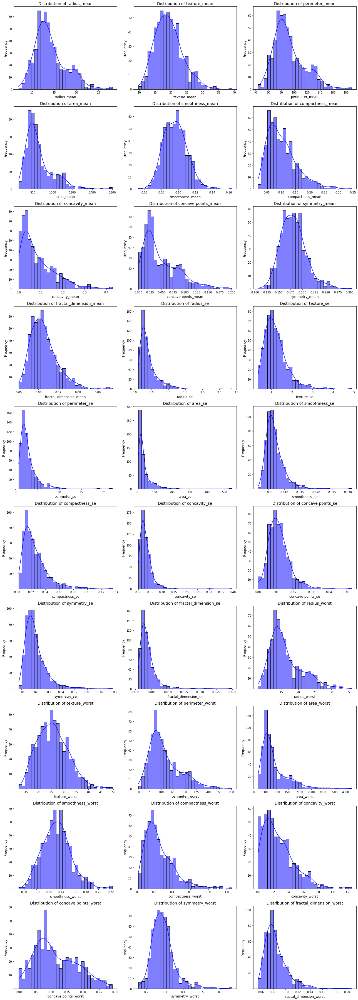

In [8]:
import seaborn as sns

df_features = df.iloc[:, :-1]

# Visualize the distribution of all features except the target
def plot_distributions(df, cols_per_row=3):
    num_cols = len(df.columns)
    num_rows = (num_cols // cols_per_row) + int(num_cols % cols_per_row > 0)

    plt.figure(figsize=(cols_per_row * 6, num_rows * 5))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(num_rows, cols_per_row, i)
        sns.histplot(df[column], kde=True, bins=30, color='blue', edgecolor='black')
        plt.title(f"Distribution of {column}", fontsize=14)  # Increased title font size
        plt.xlabel(column, fontsize=12)  # Increased x-label font size
        plt.ylabel("Frequency", fontsize=12)  # Increased y-label font size
        plt.tight_layout()
    plt.show()

# Call the function to plot distributions
plot_distributions(df_features, cols_per_row=3)

## Checking for Outliers

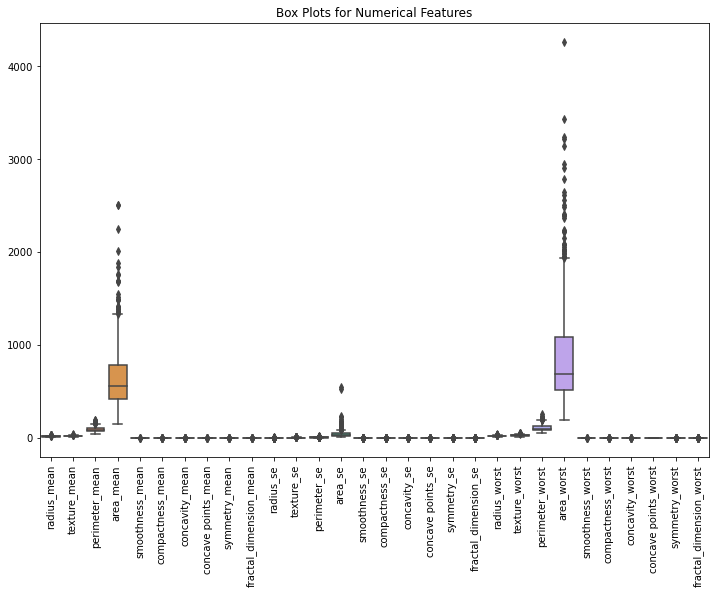

In [9]:
import seaborn as sns

# Plot boxplots for numerical columns
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title('Box Plots for Numerical Features')
plt.show()

## Verify Outliers Using IQR

In [10]:
# Loop through all columns except target label
for column in df.columns:
    if column != 'diagnosis':
        # Calculate Q1, Q3, and IQR for each column
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define the outlier thresholds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Check for outliers
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]

        # Print if no outliers are found for the column
        if outliers.empty:
            print(f"No outliers detected in {column}")
        else:
            print(f"Outliers detected in {column}:")
            print(outliers[[column]])

Outliers detected in radius_mean:
     radius_mean
82         25.22
108        22.27
122        24.25
164        23.27
180        27.22
202        23.29
212        28.11
236        23.21
339        23.51
352        25.73
369        22.01
461        27.42
503        23.09
521        24.63
Outliers detected in texture_mean:
     texture_mean
219         32.47
232         33.81
239         39.28
259         33.56
265         31.12
455         30.72
562         30.62
Outliers detected in perimeter_mean:
     perimeter_mean
82            171.5
108           152.8
122           166.2
164           152.1
180           182.1
202           158.9
212           188.5
236           153.5
339           155.1
352           174.2
461           186.9
503           152.1
521           165.5
Outliers detected in area_mean:
     area_mean
23      1404.0
82      1878.0
108     1509.0
122     1761.0
164     1686.0
180     2250.0
202     1685.0
212     2499.0
236     1670.0
250     1364.0
265     1419.0
272

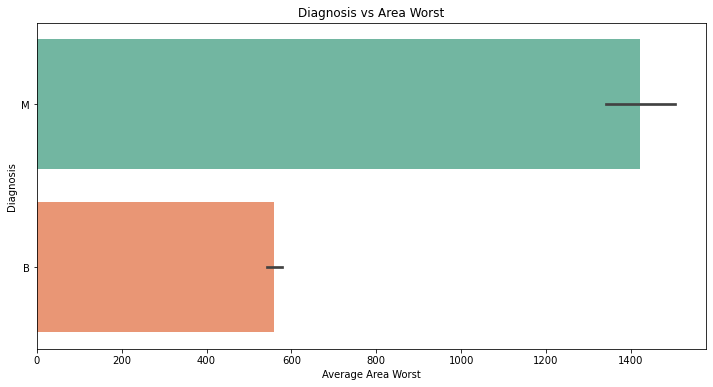

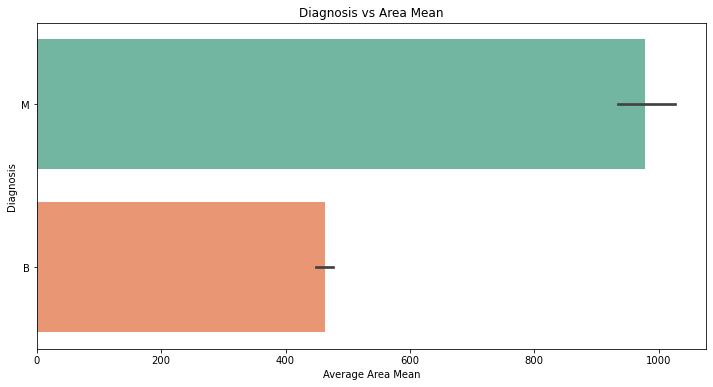

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot Diagnosis vs area_worst (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_worst', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Worst')
plt.xlabel('Average Area Worst')
plt.ylabel('Diagnosis')
plt.show()

# Plot Diagnosis vs area_mean (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_mean', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Mean')
plt.xlabel('Average Area Mean')
plt.ylabel('Diagnosis')
plt.show()

## Handle Outliers using IQR

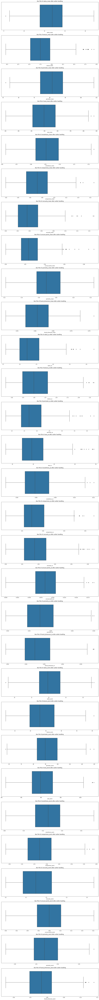

In [12]:
# Define a function to handle outliers using the IQR method
def handle_outliers_iqr(data, column, factor=1.5):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data

# Apply the function to all numeric columns except the last column
numeric_columns = df.select_dtypes(include=['number']).columns[:-1]  # Exclude the last column
for column in numeric_columns:
    df = handle_outliers_iqr(df, column=column)

# Reset the index after removing outliers
df = df.reset_index(drop=True)

# Verify the changes for all numeric columns
plt.figure(figsize=(15, len(df.select_dtypes(include=['number']).columns) * 5))
for i, column in enumerate(df.select_dtypes(include=['number']).columns, 1):
    plt.subplot(len(df.select_dtypes(include=['number']).columns), 1, i)
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column} after outlier handling')
    plt.xlabel(column)

plt.tight_layout()
plt.show()

## Boxplot for Cleaned Data after Handling Outliers

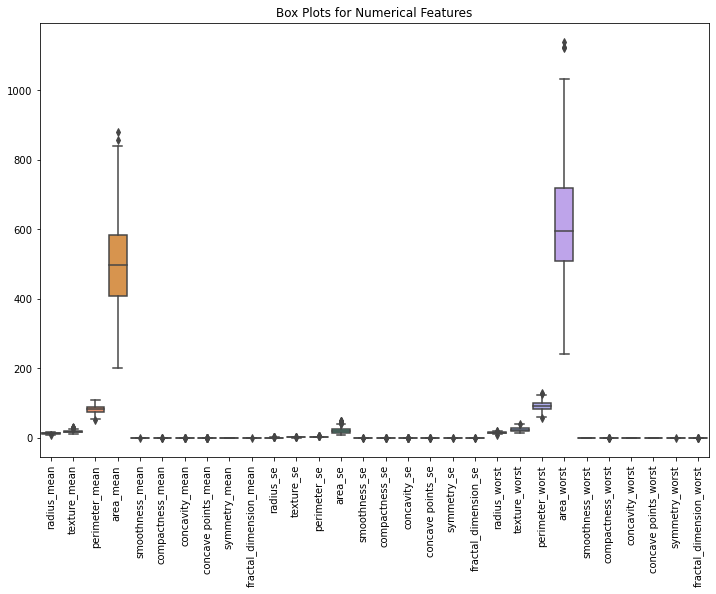

In [13]:
# Plot boxplots for numerical columns
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title('Box Plots for Numerical Features')
plt.show()

In [14]:
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,14.680,20.13,94.74,684.5,0.09867,0.07200,0.07395,0.05259,0.1586,0.05922,...,30.88,123.40,1138.0,0.14640,0.18710,0.29140,0.16090,0.3029,0.08216,M
1,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,0.05766,...,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259,B
2,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.03110,0.1967,0.06811,...,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183,B
3,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.02076,0.1815,0.06905,...,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,B
4,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,0.05863,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,12.770,29.43,81.35,507.9,0.08276,0.04234,0.01997,0.01499,0.1539,0.05637,...,36.00,88.10,594.7,0.12340,0.10640,0.08653,0.06498,0.2407,0.06484,B
278,12.880,28.92,82.50,514.3,0.08123,0.05824,0.06195,0.02343,0.1566,0.05708,...,35.74,88.84,595.7,0.12270,0.16200,0.24390,0.06493,0.2372,0.07242,B
279,10.290,27.61,65.67,321.4,0.09030,0.07658,0.05999,0.02738,0.1593,0.06127,...,34.91,69.57,357.6,0.13840,0.17100,0.20000,0.09127,0.2226,0.08283,B
280,14.050,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,0.1537,0.06171,...,33.17,100.20,706.7,0.12410,0.22640,0.13260,0.10480,0.2250,0.08321,B


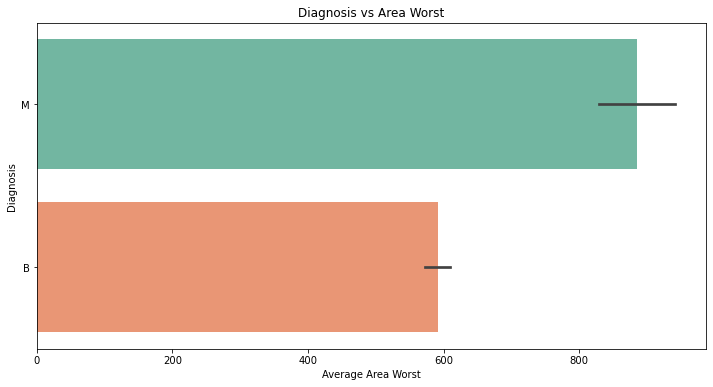

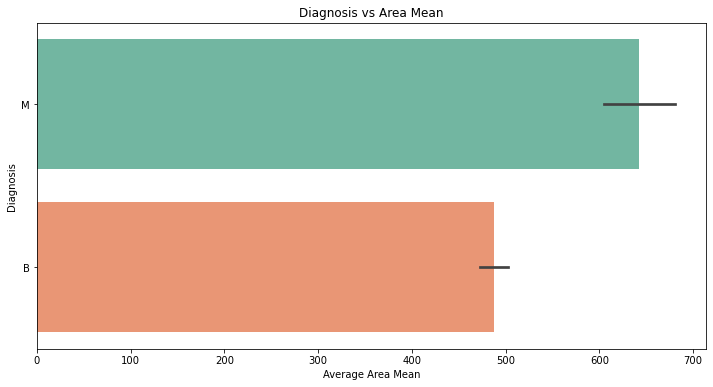

In [15]:
# Plot Diagnosis vs area_worst (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_worst', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Worst')
plt.xlabel('Average Area Worst')
plt.ylabel('Diagnosis')
plt.show()

# Plot Diagnosis vs area_mean (Horizontal Bar Plot)
plt.figure(figsize=(12, 6))
sns.barplot(x='area_mean', y='diagnosis', data=df, palette='Set2')
plt.title('Diagnosis vs Area Mean')
plt.xlabel('Average Area Mean')
plt.ylabel('Diagnosis')
plt.show()

# Class Distribution

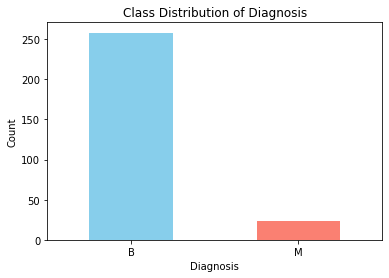

In [16]:
df['diagnosis'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Class Distribution of Diagnosis')
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

# Feature Distribution

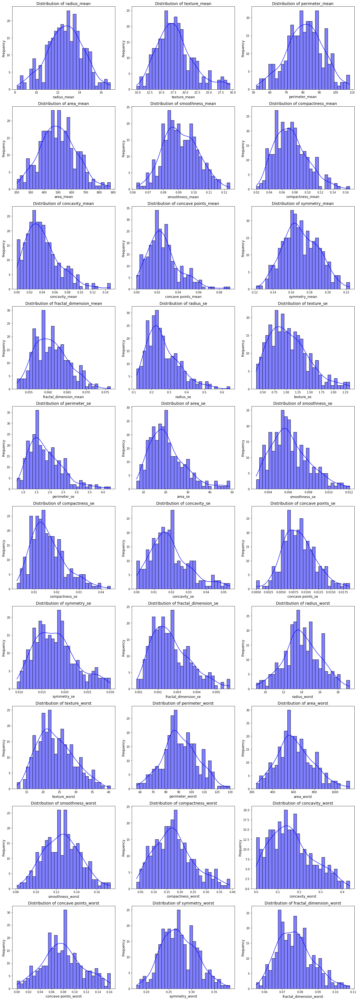

In [17]:
df_features = df.iloc[:, :-1]

# Visualize the distribution of all features except the target
def plot_distributions(df, cols_per_row=3):
    num_cols = len(df.columns)
    num_rows = (num_cols // cols_per_row) + int(num_cols % cols_per_row > 0)

    plt.figure(figsize=(cols_per_row * 6, num_rows * 5))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(num_rows, cols_per_row, i)
        sns.histplot(df[column], kde=True, bins=30, color='blue', edgecolor='black')
        plt.title(f"Distribution of {column}", fontsize=14)  # Increased title font size
        plt.xlabel(column, fontsize=12)  # Increased x-label font size
        plt.ylabel("Frequency", fontsize=12)  # Increased y-label font size
        plt.tight_layout()
    plt.show()

# Call the function to plot distributions
plot_distributions(df_features, cols_per_row=3)

# Descriptive Statistical Analysis

In [18]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,...,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000,282.000000
mean,12.643305,17.833404,81.183901,500.468440,0.091311,0.073976,0.040512,0.026113,0.170441,0.060880,...,14.049606,23.832553,91.176844,616.247518,0.125326,0.176890,0.162144,0.079563,0.272316,0.077037
std,1.673404,3.813450,11.180952,130.773765,0.011341,0.025626,0.027231,0.015468,0.019167,0.004429,...,1.982390,5.486465,13.486601,172.875974,0.017906,0.075817,0.099913,0.035083,0.038722,0.009984
min,8.196000,9.710000,51.710000,201.900000,0.062510,0.019380,0.000000,0.000000,0.121500,0.051850,...,8.964000,12.020000,57.260000,242.200000,0.081250,0.034320,0.000000,0.000000,0.178300,0.055210
25%,11.547500,15.217500,73.872500,408.425000,0.083227,0.053622,0.020675,0.015820,0.157325,0.057340,...,12.880000,19.770000,83.015000,509.300000,0.112075,0.123225,0.084987,0.057443,0.244450,0.069532
50%,12.755000,17.445000,81.545000,496.500000,0.090515,0.071875,0.035815,0.023435,0.168600,0.060610,...,13.885000,23.050000,89.795000,595.200000,0.125600,0.171000,0.148100,0.079565,0.268950,0.076615
75%,13.747500,19.622500,88.422500,583.750000,0.099135,0.088938,0.053940,0.032720,0.184775,0.063727,...,15.337500,27.737500,99.707500,719.575000,0.137925,0.218675,0.226525,0.101150,0.300400,0.082720
max,16.840000,29.430000,108.400000,880.200000,0.123700,0.166100,0.147800,0.090290,0.223800,0.076330,...,19.280000,40.540000,129.800000,1138.000000,0.173300,0.390400,0.434100,0.161400,0.384900,0.108000


## Measuring Central Tendency

In [19]:
# Select column
columns_to_analyze = df.columns[:-1]

# Calculate mean, median, and mode for each column
mean_values = df[columns_to_analyze].mean()
median_values = df[columns_to_analyze].median()
mode_values = df[columns_to_analyze].mode().iloc[0]

# Display the results
print("Mean values for features:")
print(mean_values)
print("\nMedian values for features:")
print(median_values)
print("\nMode values for features:")
print(mode_values)

Mean values for features:
radius_mean                 12.643305
texture_mean                17.833404
perimeter_mean              81.183901
area_mean                  500.468440
smoothness_mean              0.091311
compactness_mean             0.073976
concavity_mean               0.040512
concave points_mean          0.026113
symmetry_mean                0.170441
fractal_dimension_mean       0.060880
radius_se                    0.263395
texture_se                   1.049972
perimeter_se                 1.832372
area_se                     20.691709
smoothness_se                0.006161
compactness_se               0.016185
concavity_se                 0.019045
concave points_se            0.008604
symmetry_se                  0.018005
fractal_dimension_se         0.002665
radius_worst                14.049606
texture_worst               23.832553
perimeter_worst             91.176844
area_worst                 616.247518
smoothness_worst             0.125326
compactness_worst       

## Measures of Variability

In [20]:
# Select only numerical columns from the DataFrame
numerical_columns = df.select_dtypes(include=['number']).columns

# Calculate standard deviation, variance, and range for each numerical column
std_values = df[numerical_columns].std()
variance_values = df[numerical_columns].var()
range_values = df[numerical_columns].max() - df[numerical_columns].min()

# Display the results
print("Standard Deviation values for numerical features:")
print(std_values)
print("\nVariance values for numerical features:")
print(variance_values)
print("\nRange values for numerical features:")
print(range_values)

Standard Deviation values for numerical features:
radius_mean                  1.673404
texture_mean                 3.813450
perimeter_mean              11.180952
area_mean                  130.773765
smoothness_mean              0.011341
compactness_mean             0.025626
concavity_mean               0.027231
concave points_mean          0.015468
symmetry_mean                0.019167
fractal_dimension_mean       0.004429
radius_se                    0.091093
texture_se                   0.417405
perimeter_se                 0.632606
area_se                      8.230030
smoothness_se                0.001888
compactness_se               0.007621
concavity_se                 0.011318
concave points_se            0.003325
symmetry_se                  0.004566
fractal_dimension_se         0.000987
radius_worst                 1.982390
texture_worst                5.486465
perimeter_worst             13.486601
area_worst                 172.875974
smoothness_worst             0.017906


## Measurement of Skewness

In [21]:
# Summary statistics for all numeric columns
print("Summary Statistics for Numeric Columns:")
print(df.describe())

# Check skewness for all numeric columns
from scipy.stats import skew

print("\nSkewness for All Numeric Columns:")
skewness = df.select_dtypes(include=['number']).apply(skew)
print(skewness)

Summary Statistics for Numeric Columns:
       radius_mean  texture_mean  perimeter_mean   area_mean  smoothness_mean  \
count   282.000000    282.000000      282.000000  282.000000       282.000000   
mean     12.643305     17.833404       81.183901  500.468440         0.091311   
std       1.673404      3.813450       11.180952  130.773765         0.011341   
min       8.196000      9.710000       51.710000  201.900000         0.062510   
25%      11.547500     15.217500       73.872500  408.425000         0.083227   
50%      12.755000     17.445000       81.545000  496.500000         0.090515   
75%      13.747500     19.622500       88.422500  583.750000         0.099135   
max      16.840000     29.430000      108.400000  880.200000         0.123700   

       compactness_mean  concavity_mean  concave points_mean  symmetry_mean  \
count        282.000000      282.000000           282.000000     282.000000   
mean           0.073976        0.040512             0.026113       0.170

## Density Plot

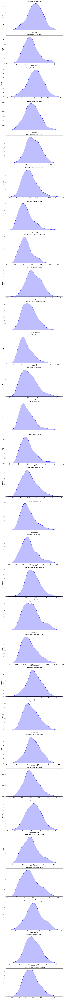

In [22]:
# Select numeric columns
numeric_columns = df.select_dtypes(include=['number']).columns

# Generate density plots for all numeric columns
plt.figure(figsize=(10, len(numeric_columns) * 5))  # Adjust figure size based on the number of columns
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns), 1, i)
    sns.kdeplot(df[column], shade=True, color='blue')
    plt.title(f'Density Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()

# Label Encoding Class

In [23]:
# Label encoding the 'Diagnosis' column: B = 0, M = 1
df['diagnosis'] = df['diagnosis'].map({'B': 0, 'M': 1})

# Display the updated dataframe to verify the change
print(df['diagnosis'].head())

0    1
1    0
2    0
3    0
4    0
Name: diagnosis, dtype: int64


In [24]:
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,14.680,20.13,94.74,684.5,0.09867,0.07200,0.07395,0.05259,0.1586,0.05922,...,30.88,123.40,1138.0,0.14640,0.18710,0.29140,0.16090,0.3029,0.08216,1
1,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,0.05766,...,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259,0
2,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.03110,0.1967,0.06811,...,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183,0
3,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.02076,0.1815,0.06905,...,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,0
4,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,0.05863,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,12.770,29.43,81.35,507.9,0.08276,0.04234,0.01997,0.01499,0.1539,0.05637,...,36.00,88.10,594.7,0.12340,0.10640,0.08653,0.06498,0.2407,0.06484,0
278,12.880,28.92,82.50,514.3,0.08123,0.05824,0.06195,0.02343,0.1566,0.05708,...,35.74,88.84,595.7,0.12270,0.16200,0.24390,0.06493,0.2372,0.07242,0
279,10.290,27.61,65.67,321.4,0.09030,0.07658,0.05999,0.02738,0.1593,0.06127,...,34.91,69.57,357.6,0.13840,0.17100,0.20000,0.09127,0.2226,0.08283,0
280,14.050,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,0.1537,0.06171,...,33.17,100.20,706.7,0.12410,0.22640,0.13260,0.10480,0.2250,0.08321,0


# Correlation

## Correlation Matrix

In [25]:
df.corr()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
radius_mean,1.000000,0.109628,0.997948,0.995690,-0.097924,0.287280,0.430632,0.551520,-0.082722,-0.521929,...,0.087272,0.949768,0.944910,-0.210960,0.284306,0.354200,0.512751,-0.077424,-0.220400,0.312074
texture_mean,0.109628,1.000000,0.112122,0.112071,-0.147993,0.049878,0.142001,0.050848,-0.023888,-0.113146,...,0.916106,0.141645,0.151594,-0.075880,0.093321,0.134270,0.086597,-0.070143,-0.049255,0.269303
perimeter_mean,0.997948,0.112122,1.000000,0.993345,-0.055318,0.345109,0.476987,0.591644,-0.054941,-0.481665,...,0.091468,0.957685,0.947200,-0.174372,0.334074,0.395933,0.550839,-0.052669,-0.177973,0.326744
area_mean,0.995690,0.112071,0.993345,1.000000,-0.111263,0.273646,0.435677,0.551251,-0.087327,-0.521713,...,0.089983,0.949296,0.953109,-0.213366,0.277364,0.357342,0.511175,-0.084088,-0.220719,0.332115
smoothness_mean,-0.097924,-0.147993,-0.055318,-0.111263,1.000000,0.683536,0.412869,0.526440,0.393319,0.630972,...,-0.094318,-0.012299,-0.059363,0.783970,0.357135,0.273189,0.428609,0.283674,0.448391,0.114724
compactness_mean,0.287280,0.049878,0.345109,0.273646,0.683536,1.000000,0.771841,0.768761,0.408482,0.495897,...,0.060974,0.404843,0.318198,0.516022,0.814573,0.671747,0.718365,0.334828,0.576834,0.248143
concavity_mean,0.430632,0.142001,0.476987,0.435677,0.412869,0.771841,1.000000,0.861060,0.299870,0.170092,...,0.176494,0.537852,0.483785,0.374199,0.721399,0.871990,0.802331,0.235093,0.372581,0.459876
concave points_mean,0.551520,0.050848,0.591644,0.551251,0.526440,0.768761,0.861060,1.000000,0.273940,0.127308,...,0.081482,0.627826,0.582442,0.394455,0.590615,0.641025,0.866873,0.182843,0.251726,0.443813
symmetry_mean,-0.082722,-0.023888,-0.054941,-0.087327,0.393319,0.408482,0.299870,0.273940,1.000000,0.280353,...,-0.010861,-0.017058,-0.067055,0.273311,0.281636,0.233447,0.247742,0.638776,0.204249,0.045579
fractal_dimension_mean,-0.521929,-0.113146,-0.481665,-0.521713,0.630972,0.495897,0.170092,0.127308,0.280353,1.000000,...,-0.101688,-0.420351,-0.465576,0.574684,0.326307,0.151512,0.103303,0.268041,0.754294,-0.042515


## Correlation Heatmap

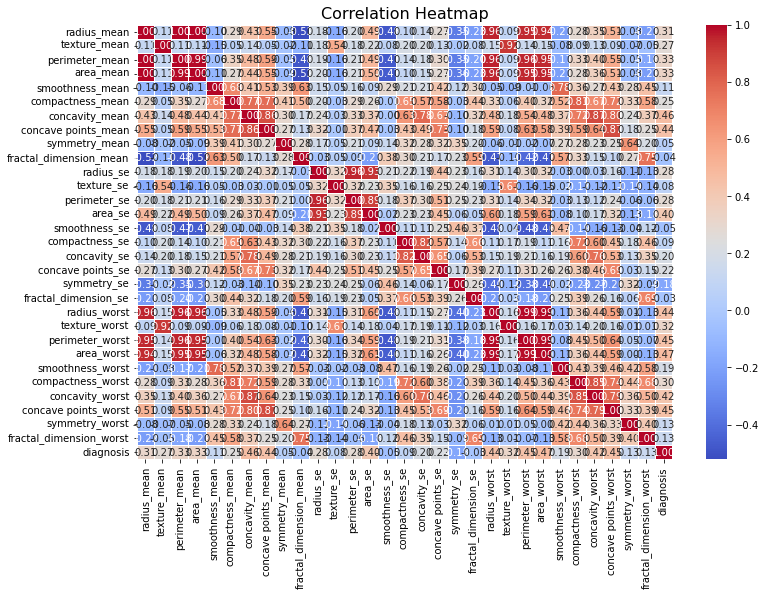

In [26]:
# Compute the correlation matrix
correlation_matrix = df.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(12, 8))  # Adjust figure size
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Customize the plot
plt.title('Correlation Heatmap', fontsize=16)
plt.show()

## Feature Correlation By Ranking

In [27]:
correlation_with_success = correlation_matrix['diagnosis']

# Sort the correlation values in descending order
correlation_ranked = correlation_with_success.sort_values(ascending=False)

# Print the ranked correlation values
print(correlation_ranked)

diagnosis                  1.000000
area_worst                 0.474932
concavity_mean             0.459876
concave points_worst       0.449633
perimeter_worst            0.445639
concave points_mean        0.443813
radius_worst               0.442276
concavity_worst            0.420221
area_se                    0.403809
area_mean                  0.332115
perimeter_mean             0.326744
texture_worst              0.317939
radius_mean                0.312074
compactness_worst          0.301421
radius_se                  0.278408
perimeter_se               0.275826
texture_mean               0.269303
compactness_mean           0.248143
concave points_se          0.219809
concavity_se               0.198395
smoothness_worst           0.192164
fractal_dimension_worst    0.134918
symmetry_worst             0.128524
smoothness_mean            0.114724
compactness_se             0.088242
texture_se                 0.077115
symmetry_mean              0.045579
fractal_dimension_se      -0

## Feature Correlation by Class Visualized

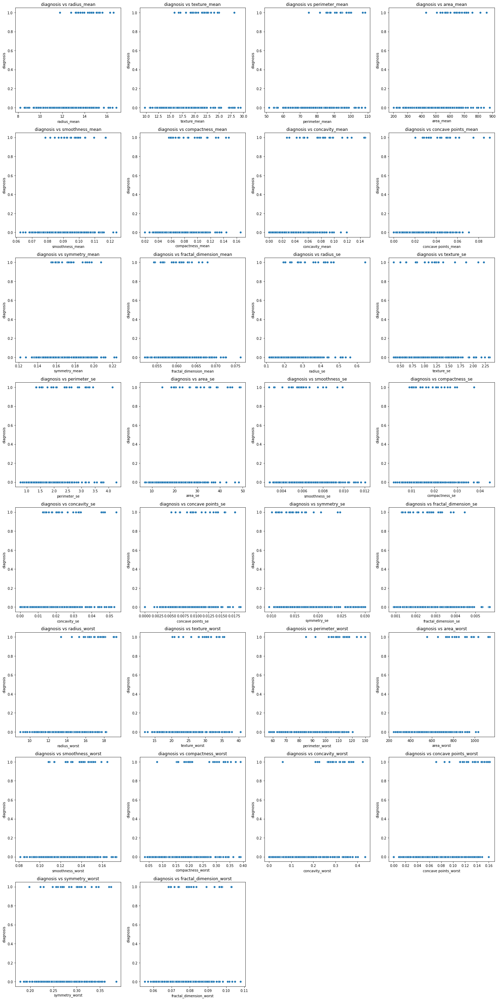

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot scatter plots for features vs target
def plot_scatter_features_vs_target(df, features, target, cols_per_row=4):
    num_features = len(features)
    rows = (num_features // cols_per_row) + (1 if num_features % cols_per_row != 0 else 0)
    
    plt.figure(figsize=(cols_per_row * 5, rows * 5))
    
    # Iterate through each feature and plot it against the target
    for i, feature in enumerate(features):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.scatterplot(x=df[feature], y=df[target])
        plt.title(f'{target} vs {feature}')
        plt.xlabel(feature)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

# Get the feature columns dynamically (all columns except the last one)
features = df.columns[:-1]

# Get the target column dynamically (the last column)
target = df.columns[-1]

# Call the function to plot scatter plots
plot_scatter_features_vs_target(df, features, target, cols_per_row=4)

# Feature Relationship 

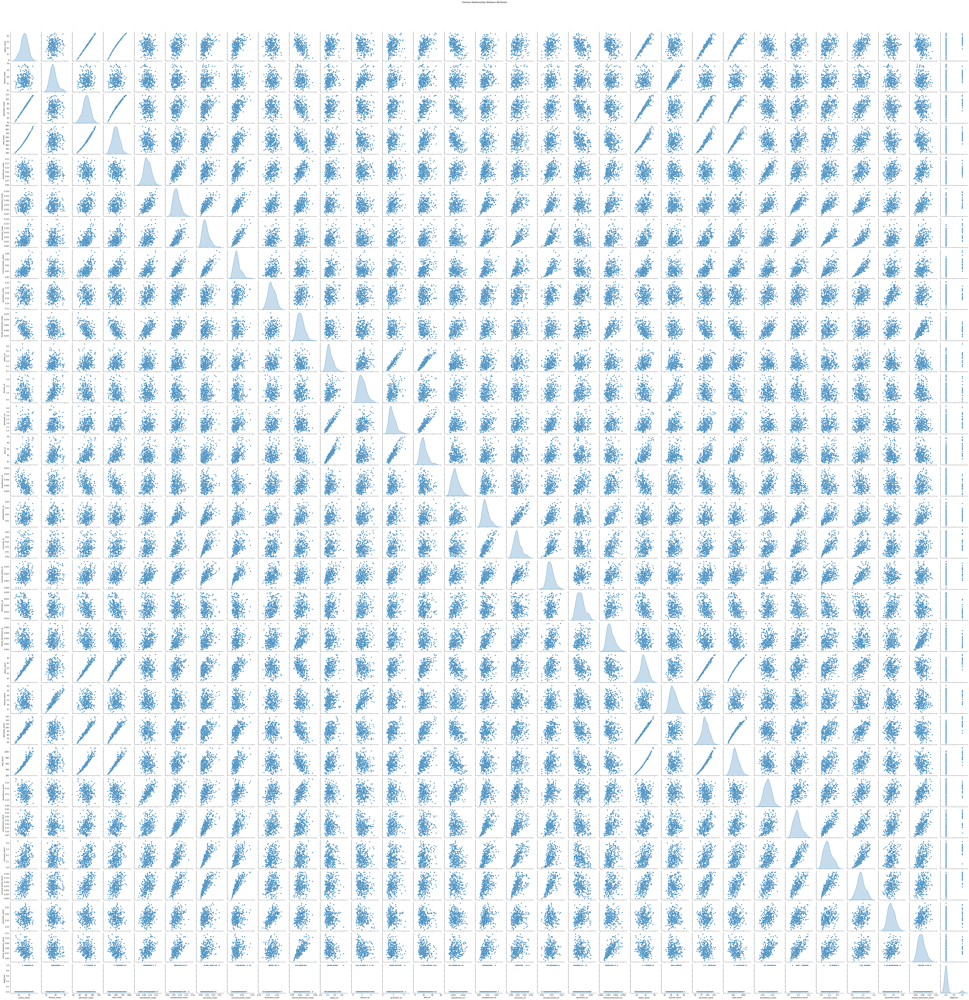

In [30]:
# Pairplot to visualize relationships
sns.pairplot(df, diag_kind="kde")
plt.suptitle("Pairwise Relationships Between Attributes", y=1.02)
plt.show()

# Feature Importance

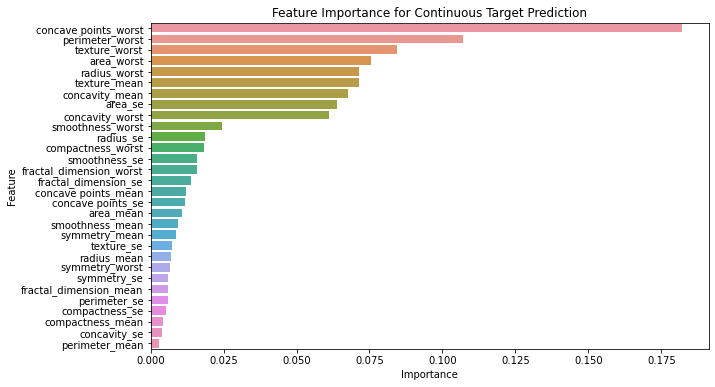

In [31]:
from sklearn.ensemble import RandomForestRegressor

# Prepare data
X = df.drop(columns=[df.columns[-1]])  # Drop the last column (target)
y = df[df.columns[-1]]  # Select the last column (target

# Train a Random Forest Regressor model
rf = RandomForestRegressor()
rf.fit(X, y)

# Get feature importances
importances = rf.feature_importances_

# Create a DataFrame for feature importances
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot the feature importance
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importance for Continuous Target Prediction')
plt.show()

# Feature Selection RFE

In [32]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression 

# Create the model
model = LogisticRegression() 

# Create the RFE model and select the top 5 features 
rfe = RFE(estimator=model, n_features_to_select=5)
rfe.fit(X, y)

# Print the features selected by RFE
selected_features = X.columns[rfe.support_]
print(f"Selected Features: {selected_features}")

# Print the ranking of all features
print(f"Feature Ranking: {rfe.ranking_}")

C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Selected Features: Index(['radius_mean', 'concavity_mean', 'perimeter_se', 'radius_worst',
       'concavity_worst'],
      dtype='object')
Feature Ranking: [ 1 13 14 19  8 11  1  7 12 24 23  4  1 18 22 21 10 20 26 25  1  3  2 16
  6 15  1  5  9 17]


C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\amiru\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

In [33]:
# Retain only the selected features in the DataFrame
df_rfe = df[selected_features]

# Optionally, you can add the target column ('Air Quality') back to df_selected
df_rfe['diagnosis'] = y

df_rfe

C:\Users\amiru\AppData\Local\Temp\ipykernel_14784\3567963964.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rfe['diagnosis'] = y


,radius_mean,concavity_mean,perimeter_se,radius_worst,concavity_worst,diagnosis
0,14.680,0.07395,3.195,19.07,0.29140,1
1,13.540,0.06664,2.058,15.11,0.23900,0
2,13.080,0.04568,1.383,14.50,0.18900,0
3,9.504,0.02956,1.909,10.23,0.08867,0
4,13.030,0.02562,1.170,13.30,0.04833,0
...,...,...,...,...,...,...
277,12.770,0.01997,1.477,13.87,0.08653,0
278,12.880,0.06195,1.502,13.89,0.24390,0
279,10.290,0.05999,1.437,10.84,0.20000,0
280,14.050,0.04462,2.888,15.30,0.13260,0


# Feature Scaling

## Reverify Feature Distribution

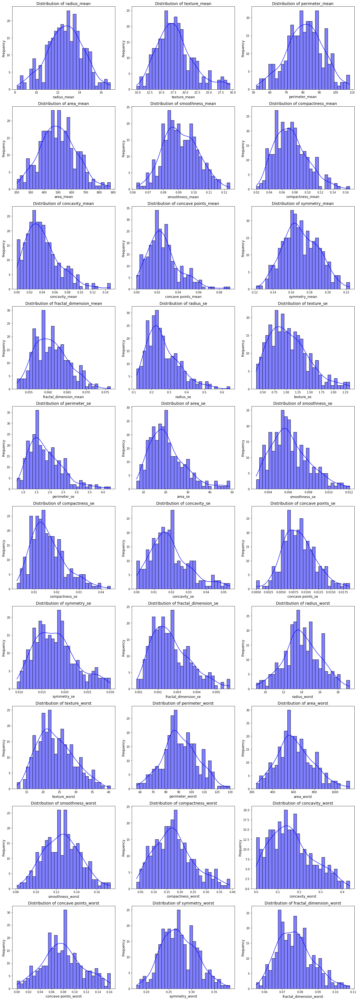

In [34]:
import seaborn as sns

df_features = df.iloc[:, :-1]

# Visualize the distribution of all features except the target
def plot_distributions(df, cols_per_row=3):
    num_cols = len(df.columns)
    num_rows = (num_cols // cols_per_row) + int(num_cols % cols_per_row > 0)

    plt.figure(figsize=(cols_per_row * 6, num_rows * 5))
    for i, column in enumerate(df.columns, 1):
        plt.subplot(num_rows, cols_per_row, i)
        sns.histplot(df[column], kde=True, bins=30, color='blue', edgecolor='black')
        plt.title(f"Distribution of {column}", fontsize=14)  # Increased title font size
        plt.xlabel(column, fontsize=12)  # Increased x-label font size
        plt.ylabel("Frequency", fontsize=12)  # Increased y-label font size
        plt.tight_layout()
    plt.show()

# Call the function to plot distributions
plot_distributions(df_features, cols_per_row=3)

In [35]:
df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,14.680,20.13,94.74,684.5,0.09867,0.07200,0.07395,0.05259,0.1586,0.05922,...,30.88,123.40,1138.0,0.14640,0.18710,0.29140,0.16090,0.3029,0.08216,1
1,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,0.05766,...,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259,0
2,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.03110,0.1967,0.06811,...,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183,0
3,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.02076,0.1815,0.06905,...,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,0
4,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,0.05863,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,12.770,29.43,81.35,507.9,0.08276,0.04234,0.01997,0.01499,0.1539,0.05637,...,36.00,88.10,594.7,0.12340,0.10640,0.08653,0.06498,0.2407,0.06484,0
278,12.880,28.92,82.50,514.3,0.08123,0.05824,0.06195,0.02343,0.1566,0.05708,...,35.74,88.84,595.7,0.12270,0.16200,0.24390,0.06493,0.2372,0.07242,0
279,10.290,27.61,65.67,321.4,0.09030,0.07658,0.05999,0.02738,0.1593,0.06127,...,34.91,69.57,357.6,0.13840,0.17100,0.20000,0.09127,0.2226,0.08283,0
280,14.050,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,0.1537,0.06171,...,33.17,100.20,706.7,0.12410,0.22640,0.13260,0.10480,0.2250,0.08321,0


## Min-Max Scaling

In [36]:
from sklearn.preprocessing import MinMaxScaler

# Convert DataFrame to numpy array
array = df.values

# Separate array into input (X) and output (Y) components
X = array[:, :-1]  # Input features (all rows, all columns except the last one)
Y = array[:, -1]   # Output target (all rows, only the last column)

# Initialize MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Rescale the input features
rescaledX = scaler.fit_transform(X)

# Print first 5 rescaled inputs
print(rescaledX[0:5, :])

[[0.75011569 0.52839757 0.7590404  0.71148459 0.59094623 0.35864231
  0.50033829 0.58245653 0.36265885 0.30106209 0.67472154 0.44393985
  0.69261364 0.91230973 0.31352992 0.22375084 0.37199777 0.59115139
  0.22247695 0.24691921 0.97964327 0.66129032 0.91177281 1.
  0.70776752 0.42906089 0.6712739  0.99690211 0.60309777 0.51051335]
 [0.6182323  0.23580122 0.63062268 0.53722542 0.5765648  0.4219602
  0.45087957 0.529516   0.65493646 0.2373366  0.29186332 0.21616712
  0.36960227 0.3960953  0.61101474 0.29492691 0.44442376 0.70095949
  0.50051217 0.29152317 0.59577356 0.25385694 0.58505652 0.52355436
  0.68169473 0.40153898 0.55056439 0.79801735 0.57792836 0.32922902]
 [0.5650162  0.30425963 0.59834186 0.46896653 0.73525086 0.733506
  0.30906631 0.34444568 0.73509286 0.66421569 0.13196149 0.19552932
  0.17784091 0.18596956 0.13779271 0.39954142 0.31614225 0.34594883
  0.35320228 0.31745571 0.53664211 0.29698457 0.53529087 0.43346729
  0.54263987 0.68321725 0.43538355 0.45123916 0.67812197 

In [37]:
# Verify total rows and columns are matched

# Print the dimensions of rescaledX
print("Total Rows in rescaledX:", rescaledX.shape[0])
print("Total Columns in rescaledX:", rescaledX.shape[1])

# Compare with the first 30 columns of df
df_subset = df.iloc[:, :30]  # Select the first 30 columns
print("Total Rows in df (first 30 columns):", df_subset.shape[0])
print("Total Columns in df (first 30 columns):", df_subset.shape[1])

# Check if the totals match
if rescaledX.shape == df_subset.shape:
    print("\nThe total rows and columns match!")
else:
    print("\nThe totals do not match.")

# Show rescaledX for further inspection (optional)
print("\nRescaled Input Features (first 5 rows):")
rescaledX

Total Rows in rescaledX: 282
Total Columns in rescaledX: 30
Total Rows in df (first 30 columns): 282
Total Columns in df (first 30 columns): 30

The total rows and columns match!

Rescaled Input Features (first 5 rows):


array([[0.75011569, 0.52839757, 0.7590404 , ..., 0.99690211, 0.60309777,
        0.51051335],
       [0.6182323 , 0.23580122, 0.63062268, ..., 0.79801735, 0.57792836,
        0.32922902],
       [0.5650162 , 0.30425963, 0.59834186, ..., 0.45123916, 0.67812197,
        0.50426217],
       ...,
       [0.24224896, 0.90770791, 0.24625154, ..., 0.56548947, 0.21442401,
        0.52320515],
       [0.67723276, 0.88438134, 0.69977068, ..., 0.64931846, 0.22604066,
        0.53040349],
       [0.97223508, 0.93154158, 0.99823602, ..., 0.87856258, 0.21055179,
        0.43549915]])

In [38]:
Y

array([1., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

# Data Preparation 

## Splitting to Train and Test Data

In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split

array = df.values

# Extract X (features) and y (target)
X = rescaledX
y = Y

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## Checking for Total Training and Test Data After Splitting

In [40]:
print("Total training data of X:", len(X_train))
print("Total test data of X:", len(X_test))
print()
print("Total training data of Y:", len(y_train))
print("Total test data of Y:", len(y_test))

Total training data of X: 197
Total test data of X: 85

Total training data of Y: 197
Total test data of Y: 85


##  Checking for Data Imbalance in Training Data

In [41]:
# Convert y_train to pandas Series if it is a NumPy array
y_train_series = pd.Series(y_train)

# Calculate the class distribution in the training data
class_dist_train = y_train_series.value_counts()
print("Class distribution in training data:")
print(class_dist_train)
print()

# Calculate the percentage for each class in the training data
total_samples_train = class_dist_train.sum()
percentages_train = (class_dist_train / total_samples_train) * 100
print("Class Percentages in Training Data:")
print(percentages_train)

Class distribution in training data:
0.0    178
1.0     19
dtype: int64

Class Percentages in Training Data:
0.0    90.35533
1.0     9.64467
dtype: float64


## SMOTE Oversampling for Minority Class

In [42]:
from imblearn.over_sampling import SMOTE

# Convert y_train to a pandas Series for easier manipulation
y_train = pd.Series(y_train)

print('Before Oversampling:')
print(y_train.value_counts())

# Apply SMOTE for oversampling only on the training set
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Convert y_train_smote back to a pandas Series to use value_counts()
y_train_smote = pd.Series(y_train_smote)

print('After Oversampling:')
print(y_train_smote.value_counts())

Before Oversampling:
0.0    178
1.0     19
dtype: int64
After Oversampling:
0.0    178
1.0    178
dtype: int64


# Train, Test and Evaluate Models

Logistic Regression: Accuracy: 0.906
Classification Report for Logistic Regression:
               precision    recall  f1-score   support

         0.0       0.99      0.91      0.95        80
         1.0       0.36      0.80      0.50         5

    accuracy                           0.91        85
   macro avg       0.68      0.86      0.72        85
weighted avg       0.95      0.91      0.92        85




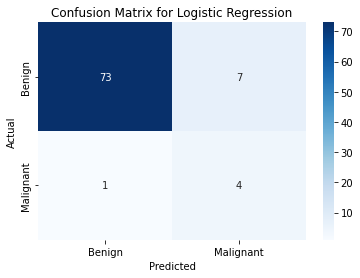

KNN: Accuracy: 0.882
Classification Report for KNN:
               precision    recall  f1-score   support

         0.0       1.00      0.88      0.93        80
         1.0       0.33      1.00      0.50         5

    accuracy                           0.88        85
   macro avg       0.67      0.94      0.72        85
weighted avg       0.96      0.88      0.91        85




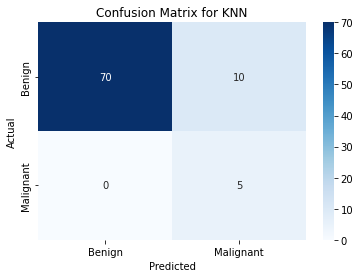

Decision Tree: Accuracy: 0.976
Classification Report for Decision Tree:
               precision    recall  f1-score   support

         0.0       0.99      0.99      0.99        80
         1.0       0.80      0.80      0.80         5

    accuracy                           0.98        85
   macro avg       0.89      0.89      0.89        85
weighted avg       0.98      0.98      0.98        85




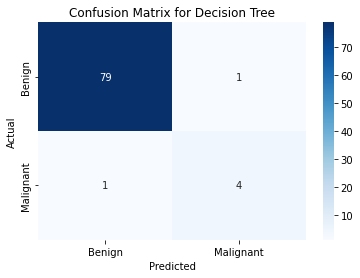

Naive Bayes: Accuracy: 0.906
Classification Report for Naive Bayes:
               precision    recall  f1-score   support

         0.0       0.99      0.91      0.95        80
         1.0       0.36      0.80      0.50         5

    accuracy                           0.91        85
   macro avg       0.68      0.86      0.72        85
weighted avg       0.95      0.91      0.92        85




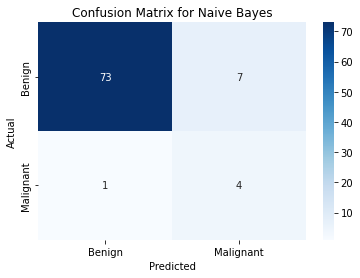

Support Vector Machine: Accuracy: 0.953
Classification Report for Support Vector Machine:
               precision    recall  f1-score   support

         0.0       0.99      0.96      0.97        80
         1.0       0.57      0.80      0.67         5

    accuracy                           0.95        85
   macro avg       0.78      0.88      0.82        85
weighted avg       0.96      0.95      0.96        85




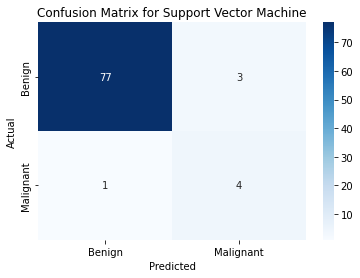

GBM: Accuracy: 0.988
Classification Report for GBM:
               precision    recall  f1-score   support

         0.0       0.99      1.00      0.99        80
         1.0       1.00      0.80      0.89         5

    accuracy                           0.99        85
   macro avg       0.99      0.90      0.94        85
weighted avg       0.99      0.99      0.99        85




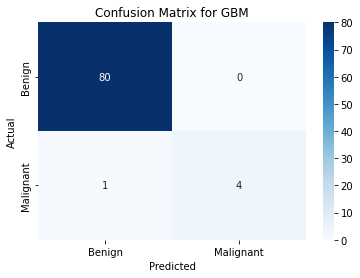

XGBoost: Accuracy: 0.965
Classification Report for XGBoost:
               precision    recall  f1-score   support

         0.0       0.98      0.99      0.98        80
         1.0       0.75      0.60      0.67         5

    accuracy                           0.96        85
   macro avg       0.86      0.79      0.82        85
weighted avg       0.96      0.96      0.96        85




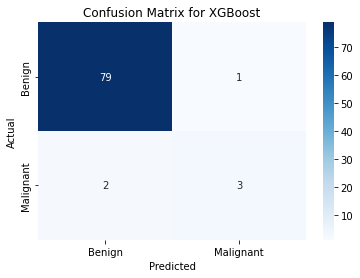

MLP: Accuracy: 0.953
Classification Report for MLP:
               precision    recall  f1-score   support

         0.0       0.97      0.97      0.97        80
         1.0       0.60      0.60      0.60         5

    accuracy                           0.95        85
   macro avg       0.79      0.79      0.79        85
weighted avg       0.95      0.95      0.95        85




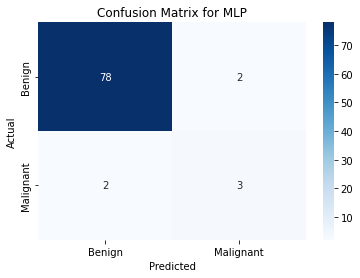

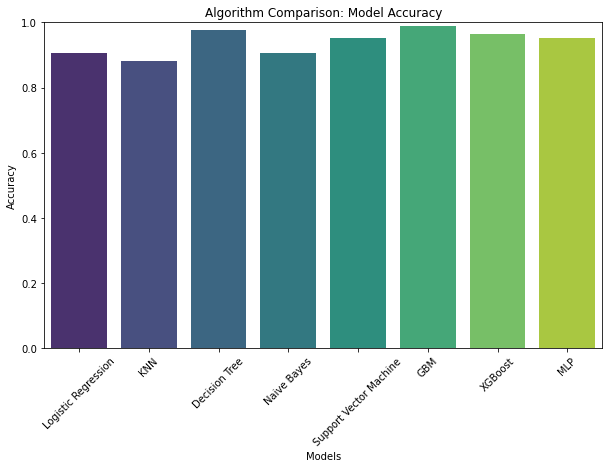

In [45]:
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score

# Prepare models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Support Vector Machine', SVC()),
    ('GBM', GradientBoostingClassifier()),
    ('XGBoost', xgb.XGBClassifier(eval_metric='mlogloss')),
    ('MLP', MLPClassifier(hidden_layer_sizes=(100, 50), max_iter=500))
]

# Prepare lists to store results and names
results = []
names = []

# Evaluate each model in turn
for name, model in models:
    # Train the model using training data (SMOTE for handling imbalance)
    model.fit(X_train_smote, y_train_smote)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Accuracy score
    accuracy = model.score(X_test, y_test)
    results.append(accuracy)
    names.append(name)
    print(f"{name}: Accuracy: {accuracy:.3f}")
    
    # Classification report
    print(f"Classification Report for {name}:\n", classification_report(y_test, y_pred))
    print()

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', 
                xticklabels=['Benign', 'Malignant'], 
                yticklabels=['Benign', 'Malignant'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Bar plot for algorithm comparison (accuracies of models)
plt.figure(figsize=(10, 6))
sns.barplot(x=names, y=results, palette='viridis')
plt.title('Algorithm Comparison: Model Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Limiting y-axis from 0 to 1 for accuracy percentage
plt.xticks(rotation=45)  # Rotate model names for better readability
plt.show()

In [47]:
# Dictionary to store predictions for each model
test_predictions = {}

# Loop through each model to train and make predictions
for name, model in models:
    # Train the model
    model.fit(X_train_smote, y_train_smote)

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Store predictions in the dictionary
    test_predictions[name] = y_pred

# Convert the predictions dictionary into a DataFrame
predictions_df = pd.DataFrame(test_predictions)

# Add the actual values for comparison
predictions_df['Actual'] = y_test

# Reorder the columns to put the 'Actual' value in the first column
predictions_df = predictions_df[['Actual'] + [col for col in predictions_df.columns if col != 'Actual']]

# Mapping to rename class labels
label_mapping = {0: 'Benign', 1: 'Malignant'}

# Rename the values in the DataFrame using the mapping
predictions_df = predictions_df.replace(label_mapping)

# Display the predictions DataFrame
print("Table of Predictions:")
predictions_df

Table of Predictions:


,Actual,Logistic Regression,KNN,Decision Tree,Naive Bayes,Support Vector Machine,GBM,XGBoost,MLP
0,Benign,Benign,Benign,Benign,Malignant,Benign,Benign,Benign,Benign
1,Benign,Malignant,Benign,Benign,Benign,Benign,Benign,Benign,Benign
2,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
3,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
4,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
...,...,...,...,...,...,...,...,...,...
80,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
81,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
82,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
83,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign,Benign
